In [ ]:
#|default_exp attack.extract

In [ ]:
%load_ext autoreload
%autoreload 2

In [ ]:
#| export
from __future__ import annotations
import relax
from relax.utils import *
from relax.methods import *
from relax import DataModule
from relax.import_essentials import *
from relax.evaluate import compute_proximity, compute_validity
from relax.ml_model import MLModule
from relax.explain import Explanation, prepare_cf_module
from relax.data_module import DEFAULT_DATA
import einops
from einops import rearrange, reduce, repeat
import copy

In [ ]:
#| export
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
import pandas as pd
from sklearn.utils import shuffle
from sklearn.base import BaseEstimator

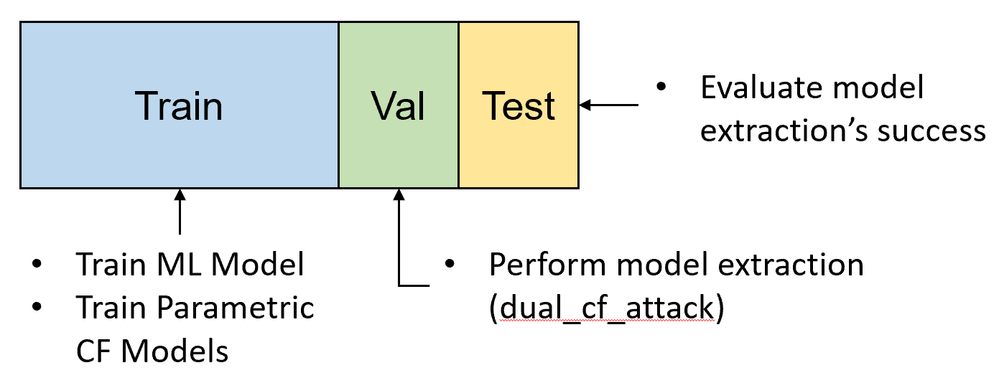

In [ ]:
#| export
class RetrainData:
    """Wrapper dataset for retraining dual counterfactuals."""

    def __init__(
        self,
        cfs: Array, 
        dual_cfs: Array,
        pred_fn: Callable[[Array], Array],
        name: str = "CFModule",
    ):
        # (n, k) -> (n, 1, k) or (n, b, k)
        cfs, dual_cfs = map(lambda x: rearrange(x, "n ... k -> n (...) k"), [cfs, dual_cfs])
        cfs_ys = pred_fn(cfs).argmax(axis=-1) # (n, 1)
        dual_cfs_ys = pred_fn(dual_cfs).argmax(axis=-1) # (n, b)

        self.parse_dual_cfs = einops.parse_shape(dual_cfs, "n ... k")
        
        retrain_xs = jnp.concatenate([cfs, dual_cfs], axis=1) # (n, b+1, k)
        retrain_ys = jnp.concatenate([cfs_ys, dual_cfs_ys], axis=1) # (n, b+1)
        # self.dual_cfs_benchmarks = self._evaluate_dual_cfs(cfs, dual_cfs, pred_fn, name)
        self.retrain_xs, self.retrain_ys = shuffle(retrain_xs, retrain_ys)
        self.key = keras.random.SeedGenerator(get_config().global_seed)
        self.pred_fn = pred_fn
        self.name = name

    def evaluate(self, pred_fn=None):
        if pred_fn is None: pred_fn = self.pred_fn
        cfs, dual_cfs = self.retrain_xs[..., 0, :], self.retrain_xs[..., 1:, :]
        validity = compute_validity(cfs, dual_cfs, pred_fn)
        proximity = compute_proximity(cfs, dual_cfs)
        return pd.DataFrame(
            {
                "validity": validity,
                "proximity": proximity,
            },
            index=[self.name],
        )

    def __len__(self):
        return len(self.retrain_xs)

    def __getitem__(self, idx):
        return self.retrain_xs[idx], self.retrain_ys[idx]

    def sample(self, n: int) -> Tuple[Array, Array]: # (n * (b+1), k), (n * (b+1), 1)
        key, _ = jrand.split(self.key.next())
        indices = jnp.arange(self.retrain_xs.shape[0])
        indices = jrand.shuffle(key, indices)[:n]
        sampled_xs, sampled_ys = self.retrain_xs[indices], self.retrain_ys[indices]
        return (
            rearrange(sampled_xs, "n ... k -> (n ...) k"), 
            rearrange(sampled_ys, "n ... -> (n ...) 1")
        )


In [ ]:
#| export
def _train_relax_model(
    model: MLModule, # Model to mimic and perform extraction attack
    dataset: tuple[Array, Array], # Dataset to train on
    train_kwargs: dict = {}, # Keyword arguments for training
):
    default_train_kwargs = {
        'epochs': 100, 'validation_split': 0., 'batch_size': 32, 'verbose': False
    }
    default_train_kwargs.update(train_kwargs or {})
    model.train(dataset, **default_train_kwargs)
    return model

In [ ]:
#| export
def _train_sklearn_model(
    model: BaseEstimator, # Model to mimic and perform extraction attack
    dataset: tuple[Array, Array], # Dataset to train on
    **kwargs
):
    model.fit(*dataset)
    return model

In [ ]:
#| export
def _train_model(
    model: MLModule | BaseEstimator, # Model to mimic and perform extraction attack
    dataset: tuple[Array, Array], # Dataset to train on
    train_kwargs: dict = {}, # Keyword arguments for training
) -> MLModule | BaseEstimator:
    """Trains a model to perform an extraction attack by mimicking the provided model on the given dataset."""
    
    if isinstance(model, MLModule):
        return _train_relax_model(model, dataset, train_kwargs)
    elif isinstance(model, BaseEstimator):
        return _train_sklearn_model(model, dataset, **train_kwargs)
    else:
        raise ValueError(f"Unsupported model type: {type(model).__name__}")

In [ ]:
# m1 = MLModule()
# m2 = MLPClassifier()
# ds = make_classification(n_samples=1000, n_features=10, n_informative=5, n_redundant=0, random_state=0)

# m1 = _train_model(m1, ds)
# m2 = _train_model(m2, ds)

In [ ]:
#| export
def _model_pred_fn_factory(model: MLModule | BaseEstimator) -> Callable[[Array], Array]:
    if isinstance(model, MLModule):
        return model.pred_fn
    elif isinstance(model, BaseEstimator):
        return model.predict_proba
    else:
        raise ValueError(f"Unsupported model type: {type(model).__name__}")

def agreement(
    exp: Explanation, # Explanation object which contains the true model
    model: MLModule | BaseEstimator, # Model to mimic and perform extraction attack
    test_xs: Array, # Test set
):
    """Computes the agreement between the true and the extracted model on the test set."""

    extracted_model = _model_pred_fn_factory(model)
    out = extracted_model(test_xs).argmax(axis=1)
    true_out = exp.pred_fn(test_xs).argmax(axis=1)
    agree = (out == true_out).mean()
    return agree

In [ ]:
#| export
def partition_data(
    val_xs: Array, # Validation set
    val_ys: Array, # Validation set labels
    val_cfs: Array, # Validation set counterfactuals
    test_xs: Array = None
):
    if test_xs is None:
        val_xs, test_xs, val_ys, test_ys, val_cfs, test_cfs = train_test_split(
            val_xs, val_ys, val_cfs, test_size=0.5, random_state=0
        )
    return val_xs, val_ys, val_cfs, test_xs

In [ ]:
#| export
class AttackFn:
    """Base class for extraction attacks."""

    def __init__(
        self, 
        attack_model: MLModule | BaseEstimator, # Model to mimic and perform extraction attack
        **kwargs
    ):
        self.model = attack_model
        self.global_key = jrand.PRNGKey(get_config().global_seed)
    
    @abstractmethod
    def __call__(
        self,
        exp: Explanation, # Generated CF explanations
        n_queries: int = 100, # Number of queries to use for extracting model
        rng_key: Array = None, # Random number generator key
        train_kwargs: dict = None, # Keyword arguments for retraining
        shuffle: bool = False, # Shuffle the dataset before retraining
    ):
        raise NotImplementedError

In [ ]:
#| export
class NaturalTraining(AttackFn):
    """Use (x_test, F(x_test)) to extract the model."""

    def __call__(
        self,
        exp: Explanation, # Generated CF explanations
        n_queries: int = 100, # Number of queries to use for extracting model
        rng_key: Array = None, # Random number generator key
        train_kwargs: dict = None, # Keyword arguments for retraining
        shuffle: bool = True, # Shuffle the dataset before retraining
    ):
        exp_val = exp['val']
        val_xs = exp_val['xs']
        val_ys = exp_val['ys']
        rng_key = self.global_key if rng_key is None else rng_key
        
        # get n_queries and their probability predictions
        if shuffle:
            self.queried_idx = jrand.permutation(
                rng_key, jnp.arange(len(val_xs)), independent=True)[:n_queries]
        else:
            self.queried_idx = jnp.arange(n_queries)
        queried_xs = val_xs[self.queried_idx]
        queried_ys = jax.nn.one_hot(
            val_ys[self.queried_idx].reshape(-1), num_classes=2)
        
        print(f"Extracting model using {n_queries} queries.")
        print(f"queried_xs.shape: {queried_xs.shape}; queried_ys.shape: {queried_ys.shape}")
        model = _train_model(self.model, (queried_xs, queried_ys), train_kwargs)
        return model

In [ ]:
#| export
class QueryModelExtraction(AttackFn):
    """Use (x_test, F(x_test)) to extract the model."""

    def __call__(
        self,
        exp: Explanation, # Generated CF explanations
        n_queries: int = 100, # Number of queries to use for extracting model
        rng_key: Array = None, # Random number generator key
        train_kwargs: dict = None, # Keyword arguments for retraining
        shuffle: bool = True, # Shuffle the dataset before retraining
    ):
        exp_val = exp['val']
        val_xs = exp_val['xs']
        rng_key = self.global_key if rng_key is None else rng_key
        
        # get n_queries and their probability predictions
        if shuffle:
            self.queried_idx = jrand.permutation(
                rng_key, jnp.arange(len(val_xs)), independent=True)[:n_queries]
        else:
            self.queried_idx = jnp.arange(n_queries)
        queried_xs = val_xs[self.queried_idx]
        queried_ys = exp.pred_fn(queried_xs)
        
        print(f"Extracting model using {n_queries} queries.")
        print(f"queried_xs.shape: {queried_xs.shape}; queried_ys.shape: {queried_ys.shape}")
        model = _train_model(self.model, (queried_xs, queried_ys), train_kwargs)
        return model

In [ ]:
#| export
class ModelExtractionCF(AttackFn):
    """Use (x_test, F(x_test)) and (cf, F(cf)) to extract the model."""

    def __call__(
        self,
        exp: Explanation, # Generated CF explanations
        n_queries: int = 100, # Number of queries to use for extracting model
        rng_key: Array = None, # Random number generator key
        train_kwargs: dict = None, # Keyword arguments for retraining
        shuffle: bool = True, # Shuffle the dataset before retraining
    ):
        exp_val = exp['val']
        val_xs, val_cfs = exp_val['xs'], exp_val['cfs']
        rng_key = self.global_key if rng_key is None else rng_key

        # get n_queries and their probability predictions
        if shuffle:
            self.queried_idx = jrand.permutation(
                rng_key, jnp.arange(len(val_xs)), independent=True)[:n_queries]
        else:
            self.queried_idx = jnp.arange(n_queries)
        queried_xs = val_xs[self.queried_idx]
        queried_ys = exp.pred_fn(queried_xs)
        # get their counterfactuals
        queried_cfs = einops.rearrange(
            val_cfs[self.queried_idx], 'n b k -> (n b) k'
        ) 
        queried_cfs_ys = exp.pred_fn(queried_cfs)

        # retrain model
        retrain_xs = jnp.concatenate([queried_xs, queried_cfs], axis=0)
        retrain_ys = jnp.concatenate([queried_ys, queried_cfs_ys], axis=0)
        
        print(f"Extracting model using {n_queries} queries.")
        print(f"retrain_xs.shape: {retrain_xs.shape}; retrain_ys.shape: {retrain_ys.shape}")
        
        model = _train_model(self.model, (retrain_xs, retrain_ys), train_kwargs)
        return model

In [ ]:
#| export
class DualCFAttack(ModelExtractionCF):
    """Use (cf_test, F(cf_test)) and (cf_cf, F(cf_cf)) to extract the model."""

    def __init__(
        self, 
        attack_model: MLModule | BaseEstimator, 
        cf_generate_fn: Callable[[Explanation], Explanation] = None, # perform dual cf generation
        **kwargs
    ):
        super().__init__(attack_model, **kwargs)
        self.cf_generate_fn = cf_generate_fn

    def set_cf_generate_fn(self, cf_generate_fn: Callable[[Explanation], Explanation]):
        self.cf_generate_fn = cf_generate_fn

    def __call__(
        self,
        exp: Explanation, # Generated CF explanations
        n_queries: int = 100, # Number of queries to use for extracting model
        rng_key: Array = None, # Random number generator key
        train_kwargs: dict = None, # Keyword arguments for retraining
        shuffle: bool = True, # Shuffle the dataset before retraining
    ):
        # generate dual cfs
        exp = self.cf_generate_fn(exp)
        
        exp_val = exp['val']
        val_cfs, val_cf_cfs = exp_val['xs'], exp_val['cfs']
        rng_key = self.global_key if rng_key is None else rng_key

        # get n_queries and their probability predictions
        if shuffle:
            self.queried_idx = jrand.permutation(
                rng_key, jnp.arange(len(val_cfs)), independent=True)[:n_queries]
        else:
            self.queried_idx = jnp.arange(n_queries)
        queried_cfs = val_cfs[self.queried_idx] # (n, k)
        queried_cfs_ys = exp.pred_fn(queried_cfs)
        # get dual cfs and their probability predictions
        queried_cf_cfs = einops.rearrange(
            val_cf_cfs[self.queried_idx], 'n b k -> (n b) k'
        )
        queried_cf_cfs_ys = exp.pred_fn(queried_cf_cfs)

        # retrain model
        retrain_xs = jnp.concatenate([queried_cf_cfs, queried_cfs], axis=0)
        retrain_ys = jnp.concatenate([queried_cf_cfs_ys, queried_cfs_ys], axis=0)
        
        print(f"Extracting model using {n_queries} queries.")
        print(f"retrain_xs.shape: {retrain_xs.shape}; retrain_ys.shape: {retrain_ys.shape}")
        
        model = _train_model(self.model, (retrain_xs, retrain_ys), train_kwargs)
        
        self.dual_exp = exp
        return model

In [ ]:
#| export
def dual_cfs_attack(
    exp: Explanation, # Generated CF explanations
    cf_module: CFModule, # CF module used to generate CFs
    model: MLModule | BaseEstimator, # Model to mimic and perform extraction attack
    test_xs: Array = None, # Test data to evaluate the model
    n_queries: int = 10, # Number of queries to use for retraining
    rng_key: Array = None, # Random number generator keys
    train_kwargs: dict = None, # Keyword arguments for retraining
    verbose: bool = False, 
    return_dual_cfs: bool = False,
):
    """Implements the dual CF attack.
    link: https://dl.acm.org/doi/abs/10.1145/3531146.3533188
    """
    
    exp_val = exp['val']
    val_xs, val_ys, val_cfs, test_xs = partition_data(
        exp_val['xs'], exp_val['ys'], exp_val['cfs'], test_xs
    )
    
    # Generate dual CFs
    val_cfs = einops.rearrange(val_cfs, 'n b k -> (n b) k')
    generate_cf_fn_partial = ft.partial(cf_module.generate_cf, pred_fn=exp.pred_fn)
    rng_key = jrand.PRNGKey(get_config().global_seed) if rng_key is None else rng_key
    dual_cfs = jax.vmap(generate_cf_fn_partial)(val_cfs, rng_key=jrand.split(rng_key, val_cfs.shape[0]))
    # Create retraining dataset
    rt_ds = RetrainData(val_cfs, dual_cfs, exp.pred_fn)
    # Retrain model
    model = _train_model(model, rt_ds.sample(n_queries), train_kwargs)
    # Calculate agreement
    agree = agreement(exp, model, test_xs)

    if verbose:
        print(f"train: {exp['train']['xs'].shape}")
        print(f"val: {val_xs.shape}")
        print(f"test: {test_xs.shape}")
        print("dual_cf benchmark: \n",rt_ds.evaluate())

    if return_dual_cfs:
        return agree, model, dual_cfs
    return agree, model

In [ ]:
#| export
def query_model(
    exp: Explanation, # Generated CF explanations
    cf_module: CFModule, # CF module used to generate CFs
    model: MLModule | BaseEstimator, # Model to mimic and perform extraction attack
    test_xs: Array = None, # Test data to evaluate the model
    n_queries: int = 10, # Number of queries to use for retraining
    rng_key: Array = None, # Random number generator keys
    train_kwargs: dict = None, # Keyword arguments for retraining
    verbose: bool = False, 
    return_dual_cfs: bool = False, # Ignored
):
    exp_val = exp['val']
    val_xs, val_ys, val_cfs, test_xs = partition_data(
        exp_val['xs'], exp_val['ys'], exp_val['cfs'], test_xs
    )

    rng_key = jrand.PRNGKey(get_config().global_seed) if rng_key is None else rng_key
    queried_xs = jrand.shuffle(rng_key, val_xs)[:n_queries, :]
    queried_ys = exp.pred_fn(queried_xs).argmax(axis=1).reshape(-1, 1)
    
    model = _train_model(model, (queried_xs, queried_ys), train_kwargs)
    # Calculate agreement
    agree = agreement(exp, model, test_xs)
    return agree, model

In [ ]:
#| export
def visualize_model_xs_cfs(xs, cfs, model, model_1=None):
    """Visualizes the decision boundary of the model and the counterfactuals."""
    # Plot original data points
    plt.scatter(xs[:, 0], xs[:, 1], c='blue', label='Data Points')
    
    # Plot counterfactuals
    plt.scatter(cfs[:, 0], cfs[:, 1], c='red', label='Counterfactuals')
    # for x, cf in zip(xs, cfs):
    #     plt.arrow(x[0], x[1], cf[0] - x[0], cf[1] - x[1], head_width=0.1, head_length=0.2, fc='black', ec='black')
    
    # Generate grid for decision boundary
    x_min, x_max = xs[:, 0].min() - 0.1, xs[:, 0].max() + 0.1
    y_min, y_max = xs[:, 1].min() - 0.1, xs[:, 1].max() + 0.1
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 1000), np.linspace(y_min, y_max, 1000))
    grid_points = np.c_[xx.ravel(), yy.ravel()]
    
    # Plot decision boundary for model
    Z = model(grid_points)[:, 1]  
    Z = Z.reshape(xx.shape)
    plt.contourf(xx, yy, Z, levels=[0., 0.5, 1.0], alpha=0.3, colors=['blue', 'white', 'yellow'])
     
    # Plot decision boundary for model_1 if provided
    if model_1:
        Z1 = model_1(grid_points)
        Z1 = Z1.reshape(xx.shape)
        plt.contour(xx, yy, Z1, levels=[0.5], colors='green', linestyles='dashed')
    
    plt.legend()
    plt.show()


## Benchmark

In [ ]:
def generate_exp(
    cf_module: CFModule, # CF module used to generate CFs
    dm: DataModule, # Data module
    pred_fn: Callable[[Array], Array], # Model prediction function
) -> tuple[Explanation, CFModule]:
    exp_dir = Path('experiments') / cf_module.name / dm.name
    if not exp_dir.exists():
        exp = relax.generate_cf_explanations(cf_module, dm, pred_fn=pred_fn)
        exp.save(exp_dir)
    else:
        cf_module = prepare_cf_module(cf_module, dm, pred_fn=pred_fn)
        exp = Explanation.load_from_path(exp_dir)
        exp.pred_fn = pred_fn
    return exp, cf_module

In [ ]:
def model_extraction_pipeline(
    cf_module: CFModule, # CF module used to generate CFs
    data_name: str, # Name of the dataset
    n_queries: int, # Number of queries to use for retraining
    attack_fn: AttackFn, # Function to perform the attack
    train_kwargs: dict = {}, # Keyword arguments for retraining
    show_benchmark: bool = False, # Whether to show the benchmark
):
    # TODO: test data leakage
    dm = relax.load_data(data_name)
    ml_module = relax.load_ml_module(data_name)
    # exp = relax.generate_cf_explanations(
    #     cf_module, dm, pred_fn=ml_module.pred_fn,
    # )
    exp, cf_module = generate_exp(cf_module, dm, ml_module.pred_fn)
    if show_benchmark:
        print(relax.benchmark_cfs([exp]))
    
    extracted_model = attack_fn(
        exp, n_queries=n_queries, train_kwargs=train_kwargs, 
    )
    return exp, extracted_model
    

In [ ]:
model = MLModule({"loss": "binary_crossentropy", "metrics": ["accuracy"]})
attack_fn = QueryModelExtraction(model)

exp, extracted_model = model_extraction_pipeline(
    DiverseCF({'lambda_2': 4}), 
    data_name='dummy', 
    n_queries=50, 
    attack_fn=attack_fn, 
    train_kwargs={'epochs': 100, 'validation_split': 0., 'batch_size': 32, 'verbose': False},
)
agreement(exp, extracted_model, exp['test']['xs'])

/home/birk/code/jax-relax/relax/explain.py:141: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


Extracting model using 50 queries.
queried_xs.shape: (50, 10); queried_ys.shape: (50, 2)


Array(0.98800004, dtype=float32)

In [ ]:
model = MLModule({"loss": "binary_crossentropy", "metrics": ["accuracy"]})
attack_fn = ModelExtractionCF(model)

exp, extracted_model = model_extraction_pipeline(
    DiverseCF({'lambda_2': 4}), 
    data_name='dummy', 
    n_queries=50, 
    attack_fn=attack_fn, 
    train_kwargs={'epochs': 100, 'validation_split': 0., 'batch_size': 32, 'verbose': False},
)
agreement(exp, extracted_model, exp['test']['xs'])

/home/birk/code/jax-relax/relax/explain.py:141: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


Extracting model using 50 queries.
retrain_xs.shape: (300, 10); retrain_ys.shape: (300, 2)


Array(0.99600005, dtype=float32)

In [ ]:
#| export
def get_gen_fn(cf_module: CFModule):
    def generate_cf_fn(exp: Explanation) -> Explanation:
        cfs = einops.rearrange(exp.cfs, 'n b k -> (n b) k')
        generate_cf_fn_partial = ft.partial(cf_module.generate_cf, pred_fn=exp.pred_fn)
        rng_key = jrand.PRNGKey(get_config().global_seed)
        dual_cfs = jax.vmap(generate_cf_fn_partial)(cfs, rng_key=jrand.split(rng_key, cfs.shape[0]))
        
        print(f"cfs.shape: {cfs.shape}; dual_cfs.shape: {dual_cfs.shape}")
        return Explanation(
            cfs=dual_cfs,
            pred_fn=exp.pred_fn,
            xs=cfs,
            ys=1-exp.ys,
            cf_name="dual_cf"
        )
    return generate_cf_fn


In [ ]:
model = MLModule({"loss": "binary_crossentropy", "metrics": ["accuracy"]})
attack_fn = DualCFAttack(model, get_gen_fn(DiverseCF({'lambda_2': 4})))

exp, extracted_model = model_extraction_pipeline(
    DiverseCF({'lambda_2': 4}), 
    data_name='dummy', 
    n_queries=50, 
    attack_fn=attack_fn, 
    train_kwargs={'epochs': 100, 'validation_split': 0., 'batch_size': 32, 'verbose': False},
)
agreement(exp, extracted_model, exp['test']['xs'])

/home/birk/code/jax-relax/relax/explain.py:141: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/1000 [00:00<?, ?it/s]

cfs.shape: (5000, 10); dual_cfs.shape: (5000, 5, 10)
Extracting model using 50 queries.
retrain_xs.shape: (300, 10); retrain_ys.shape: (300, 2)


Array(0.99600005, dtype=float32)

In [ ]:
def model_extraction_benchmark(
    cf_modules: list[CFModule], # CF module used to generate CFs
    data_name: str, # Name of the dataset
    model: MLModule | BaseEstimator, # Model to mimic and perform extraction attack
    n_queries: list[int], # Number of queries to use for retraining
    attack_fn: Callable, # Function to perform the attack
    train_kwargs: dict = {}, # Keyword arguments for retraining
) -> pd.DataFrame:
    agreements = []
    cf_names = [cf_module.name for cf_module in cf_modules]
    for cf_module in cf_modules:
        agreement_tuple = ()
        for n_query in n_queries:
            exp, extracted_model = model_extraction_pipeline(
                # cf_module, data_name, model, n_query, attack_fn, train_kwargs
                cf_module=cf_module,
                data_name=data_name,
                n_queries=n_query,
                attack_fn=attack_fn,
                train_kwargs=train_kwargs
            )
            agree = agreement(exp, extracted_model, exp['test']['xs'])
            agreement_tuple += (agree,)
        agreements.append(agreement_tuple)
    results = pd.DataFrame(agreements, index=cf_names, columns=n_queries)
    results.index.name = 'CFModule'
    return results

In [ ]:
data_names = ['german', 'titanic', 'churn']
results = []

for data_name in data_names:
    print("Evaluating ", data_name)
    n_queries = [100]
    
    model = MLModule({"loss": "binary_crossentropy", "metrics": ["accuracy"]})
    attack_fn = DualCFAttack(model, get_gen_fn(DiverseCF({'lambda_2': 4})))

    res = model_extraction_benchmark(
        cf_modules=[
            VanillaCF(),
            DiverseCF({'lambda_2': 4}),
            CounterNet(),
            CCHVAE(),
            GrowingSphere(),
            L2C()
        ],
        data_name=data_name,
        model=MLPClassifier(),
        n_queries=n_queries,
        attack_fn=attack_fn,
        train_kwargs={'epochs': 100, 'validation_split': 0., 'batch_size': 32, 'verbose': False},
    )
    results.append((data_name, res))

Evaluating  german


/home/birk/code/jax-relax/relax/explain.py:141: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/1000 [00:00<?, ?it/s]

cfs.shape: (1000, 61); dual_cfs.shape: (1000, 5, 61)
Extracting model using 100 queries.
retrain_xs.shape: (600, 61); retrain_ys.shape: (600, 2)


/home/birk/code/jax-relax/relax/explain.py:141: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/1000 [00:00<?, ?it/s]

cfs.shape: (5000, 61); dual_cfs.shape: (5000, 5, 61)
Extracting model using 100 queries.
retrain_xs.shape: (600, 61); retrain_ys.shape: (600, 2)


/home/birk/code/jax-relax/relax/legacy/ckpt_manager.py:47: UserWarning: `monitor_metrics` is not specified in `CheckpointManager`. No checkpoints will be stored.
  warnings.warn(
Epoch 99: 100%|██████████| 6/6 [00:00<00:00, 203.84batch/s, train/train_loss_1=0.013248696, train/train_loss_2=0.07519895, train/train_loss_3=0.09949755]
/home/birk/code/jax-relax/relax/explain.py:141: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/1000 [00:00<?, ?it/s]

cfs.shape: (1000, 61); dual_cfs.shape: (1000, 5, 61)
Extracting model using 100 queries.
retrain_xs.shape: (600, 61); retrain_ys.shape: (600, 2)
Epoch 1/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 339ms/step - loss: 461.6831
Epoch 2/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244.2455 
Epoch 3/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 148.9179
Epoch 4/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 91.8159
Epoch 5/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 61.9093
Epoch 6/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 45.3593
Epoch 7/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 34.3061
Epoch 8/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 27.5858
Epoch 9/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 23.1818
Epoch 10/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 20.0796


/home/birk/code/jax-relax/relax/explain.py:141: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/1000 [00:00<?, ?it/s]

cfs.shape: (1000, 61); dual_cfs.shape: (1000, 5, 61)
Extracting model using 100 queries.
retrain_xs.shape: (600, 61); retrain_ys.shape: (600, 2)


/home/birk/code/jax-relax/relax/explain.py:141: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/1000 [00:00<?, ?it/s]

cfs.shape: (1000, 61); dual_cfs.shape: (1000, 5, 61)
Extracting model using 100 queries.
retrain_xs.shape: (600, 61); retrain_ys.shape: (600, 2)
Epoch 1/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 9s 884ms/step - loss: 0.9572
Epoch 2/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8488 
Epoch 3/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.7737
Epoch 4/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.7137
Epoch 5/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.6764
Epoch 6/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.6528
Epoch 7/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.6204
Epoch 8/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5904
Epoch 9/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5659
Epoch 10/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5494


/home/birk/code/jax-relax/relax/explain.py:141: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/1000 [00:00<?, ?it/s]

cfs.shape: (1000, 61); dual_cfs.shape: (1000, 5, 61)
Extracting model using 100 queries.
retrain_xs.shape: (600, 61); retrain_ys.shape: (600, 2)
Evaluating  titanic


/home/birk/code/jax-relax/relax/explain.py:141: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/1000 [00:00<?, ?it/s]

cfs.shape: (891, 57); dual_cfs.shape: (891, 5, 57)
Extracting model using 100 queries.
retrain_xs.shape: (600, 57); retrain_ys.shape: (600, 2)


/home/birk/code/jax-relax/relax/explain.py:141: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/1000 [00:00<?, ?it/s]

cfs.shape: (4455, 57); dual_cfs.shape: (4455, 5, 57)
Extracting model using 100 queries.
retrain_xs.shape: (600, 57); retrain_ys.shape: (600, 2)


/home/birk/code/jax-relax/relax/legacy/ckpt_manager.py:47: UserWarning: `monitor_metrics` is not specified in `CheckpointManager`. No checkpoints will be stored.
  warnings.warn(
Epoch 99: 100%|██████████| 6/6 [00:00<00:00, 288.88batch/s, train/train_loss_1=0.09625164, train/train_loss_2=0.003990626, train/train_loss_3=0.07787103]
/home/birk/code/jax-relax/relax/explain.py:141: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/1000 [00:00<?, ?it/s]

cfs.shape: (891, 57); dual_cfs.shape: (891, 5, 57)
Extracting model using 100 queries.
retrain_xs.shape: (600, 57); retrain_ys.shape: (600, 2)
Epoch 1/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 511ms/step - loss: 112.4526
Epoch 2/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 40.5650 
Epoch 3/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 21.5042
Epoch 4/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 13.5264
Epoch 5/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 10.3872
Epoch 6/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 8.4704
Epoch 7/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.8386
Epoch 8/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5.8470
Epoch 9/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5.0873
Epoch 10/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.6684


/home/birk/code/jax-relax/relax/explain.py:141: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/1000 [00:00<?, ?it/s]

cfs.shape: (891, 57); dual_cfs.shape: (891, 5, 57)
Extracting model using 100 queries.
retrain_xs.shape: (600, 57); retrain_ys.shape: (600, 2)


/home/birk/code/jax-relax/relax/explain.py:141: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/1000 [00:00<?, ?it/s]

cfs.shape: (891, 57); dual_cfs.shape: (891, 5, 57)
Extracting model using 100 queries.
retrain_xs.shape: (600, 57); retrain_ys.shape: (600, 2)
Epoch 1/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 10s 947ms/step - loss: 0.8989
Epoch 2/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.8045 
Epoch 3/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.7090
Epoch 4/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.6685
Epoch 5/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.6455
Epoch 6/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.6339
Epoch 7/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.6027
Epoch 8/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5870
Epoch 9/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5506
Epoch 10/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5179


/home/birk/code/jax-relax/relax/explain.py:141: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/1000 [00:00<?, ?it/s]

cfs.shape: (891, 57); dual_cfs.shape: (891, 5, 57)
Extracting model using 100 queries.
retrain_xs.shape: (600, 57); retrain_ys.shape: (600, 2)
Evaluating  churn


/home/birk/code/jax-relax/relax/explain.py:141: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/1000 [00:00<?, ?it/s]

cfs.shape: (7043, 46); dual_cfs.shape: (7043, 5, 46)
Extracting model using 100 queries.
retrain_xs.shape: (600, 46); retrain_ys.shape: (600, 2)


/home/birk/code/jax-relax/relax/explain.py:141: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/1000 [00:00<?, ?it/s]

cfs.shape: (35215, 46); dual_cfs.shape: (35215, 5, 46)
Extracting model using 100 queries.
retrain_xs.shape: (600, 46); retrain_ys.shape: (600, 2)


/home/birk/code/jax-relax/relax/legacy/ckpt_manager.py:47: UserWarning: `monitor_metrics` is not specified in `CheckpointManager`. No checkpoints will be stored.
  warnings.warn(
Epoch 99: 100%|██████████| 42/42 [00:00<00:00, 239.69batch/s, train/train_loss_1=0.054481246, train/train_loss_2=0.0054759183, train/train_loss_3=0.16560094]
/home/birk/code/jax-relax/relax/explain.py:141: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/1000 [00:00<?, ?it/s]

cfs.shape: (7043, 46); dual_cfs.shape: (7043, 5, 46)
Extracting model using 100 queries.
retrain_xs.shape: (600, 46); retrain_ys.shape: (600, 2)
Epoch 1/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 4s 57ms/step - loss: 136.8030
Epoch 2/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 12.5327
Epoch 3/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 6.6273
Epoch 4/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 4.2108
Epoch 5/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 3.0599
Epoch 6/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 2.3436
Epoch 7/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.8980
Epoch 8/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.6289
Epoch 9/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.4054
Epoch 10/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.2328


/home/birk/code/jax-relax/relax/explain.py:141: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/1000 [00:00<?, ?it/s]

cfs.shape: (7043, 46); dual_cfs.shape: (7043, 5, 46)
Extracting model using 100 queries.
retrain_xs.shape: (600, 46); retrain_ys.shape: (600, 2)


/home/birk/code/jax-relax/relax/explain.py:141: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/1000 [00:00<?, ?it/s]

cfs.shape: (7043, 46); dual_cfs.shape: (7043, 5, 46)
Extracting model using 100 queries.
retrain_xs.shape: (600, 46); retrain_ys.shape: (600, 2)
Epoch 1/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 8s 107ms/step - loss: 1.4531
Epoch 2/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5858
Epoch 3/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2997
Epoch 4/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2021
Epoch 5/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1796
Epoch 6/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1823
Epoch 7/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1702
Epoch 8/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1620
Epoch 9/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1632
Epoch 10/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1595


/home/birk/code/jax-relax/relax/explain.py:141: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/1000 [00:00<?, ?it/s]

cfs.shape: (7043, 46); dual_cfs.shape: (7043, 5, 46)
Extracting model using 100 queries.
retrain_xs.shape: (600, 46); retrain_ys.shape: (600, 2)


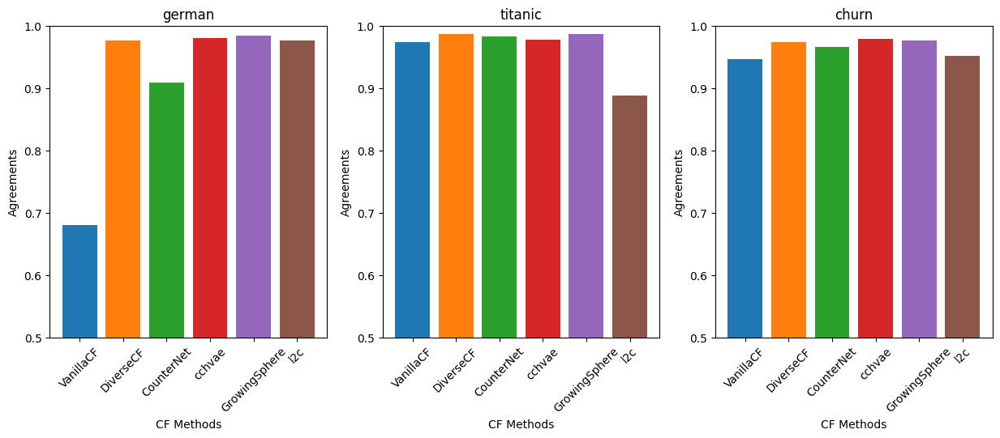

In [ ]:
def plot_bar_results(dataframe: pd.DataFrame, ax=None, title=None):
    # import matplotlib.cm as cm
    from matplotlib import colormaps as cm

    if ax is None:
        fig, ax = plt.subplots(figsize=(10, 6))
    title = title or 'Performance of CFModules for Different n_queries'
    colormap = cm.get_cmap('tab10')  # Or choose another colormap like 'viridis', 'jet'
    # colormap = cm['tab10']  # Or choose another colormap like 'viridis', 'jet'
    colors = colormap(range(len(dataframe)))

    ax.bar(dataframe.index, dataframe.to_numpy().reshape(-1), color=colors)
    ax.set_xticks(dataframe.index)
    ax.set_xticklabels(dataframe.index, rotation=45)
    ax.set_ylim(0.5, 1)
    ax.set_title(title)
    ax.set_xlabel('CF Methods')
    ax.set_ylabel('Agreements')
    # ax.grid(True)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

for i, (data_name, res) in enumerate(results):
    plot_bar_results(res, axes[i], title=data_name)
fig.savefig('../figs/extract-bar-results.pdf', bbox_inches='tight')

In [ ]:
plot_bar_results(results)

TypeError: no numeric data to plot

<Figure size 640x480 with 0 Axes>

In [ ]:
n_queries = [10, 20, 30, 50, 100]

data_names = copy.deepcopy(DEFAULT_DATA)
data_names.remove('oulad')
data_names.remove('road')
data_names.remove('credit')
data_names.remove('bioresponse')

data_and_queires = [
    (name, n_queries) for name in data_names
]
results = []

In [ ]:
for data_name, n_queries in data_and_queires:
    print("Evaluating ", data_name)
    res = model_extraction_benchmark(
        cf_modules=[
            # VanillaCF(),
            DiverseCF({'lambda_2': 4}),
            # CounterNet(),
            # CCHVAE(),
            # GrowingSphere(),
            # L2C()
        ],
        data_name=data_name,
        model=MLPClassifier(),
        n_queries=n_queries,
        attack_fn=dual_cfs_attack,
        train_kwargs={'epochs': 100, 'validation_split': 0., 'batch_size': 32, 'verbose': False},
    )
    results.append((data_name, res))

Evaluating  adult


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/legacy/ckpt_manager.py:47: UserWarning: `monitor_metrics` is not specified in `CheckpointManager`. No checkpoints will be stored.
  warnin

Epoch 1/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - loss: 37.4582
Epoch 2/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 2.1067     
Epoch 3/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.0665     
Epoch 4/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.6732    
Epoch 5/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.4609    
Epoch 6/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.3377    
Epoch 7/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.2629    
Epoch 8/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2172   
Epoch 9/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1913    
Epoch 10/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1743    


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1623    
Epoch 2/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1544     
Epoch 3/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1483     
Epoch 4/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1427    
Epoch 5/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1392     
Epoch 6/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1364     
Epoch 7/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1335     
Epoch 8/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1315    
Epoch 9/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1297    
Epoch 10/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1280    


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1266    
Epoch 2/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1260    
Epoch 3/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1251     
Epoch 4/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1243     
Epoch 5/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1240     
Epoch 6/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1232    
Epoch 7/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1227    
Epoch 8/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1219    
Epoch 9/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1217    
Epoch 10/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1216    


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1210     
Epoch 2/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1208     
Epoch 3/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1205     
Epoch 4/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1201     
Epoch 5/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1205     
Epoch 6/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1198     
Epoch 7/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1200     
Epoch 8/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1197     
Epoch 9/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1194     
Epoch 10/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1188     


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1192     
Epoch 2/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1195    
Epoch 3/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1193    
Epoch 4/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1188     
Epoch 5/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1191    
Epoch 6/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1189     
Epoch 7/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1189     
Epoch 8/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1188     
Epoch 9/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1192     
Epoch 10/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1189     


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Epoch 1/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 7s 18ms/step - loss: 0.8193   
Epoch 2/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1761     
Epoch 3/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1572    
Epoch 4/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1505    
Epoch 5/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1449    
Epoch 6/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1433   
Epoch 7/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1417    
Epoch 8/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1434    
Epoch 9/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1386   
Epoch 10/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1384   


/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Epoch 1/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - loss: 0.8046
Epoch 2/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1726   
Epoch 3/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1526   
Epoch 4/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1437   
Epoch 5/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1405    
Epoch 6/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1384    
Epoch 7/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1355    
Epoch 8/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1408    
Epoch 9/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1386    
Epoch 10/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1369    


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - loss: 0.8493
Epoch 2/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1739 
Epoch 3/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1536 
Epoch 4/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1499    
Epoch 5/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1472    
Epoch 6/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1452     
Epoch 7/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1420     
Epoch 8/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1418     
Epoch 9/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1399    
Epoch 10/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1411    


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - loss: 0.7686
Epoch 2/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1669  
Epoch 3/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1505   
Epoch 4/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1436   
Epoch 5/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1407    
Epoch 6/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1371    
Epoch 7/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1378    
Epoch 8/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1354    
Epoch 9/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1390    
Epoch 10/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1354    


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - loss: 0.9927
Epoch 2/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1779   
Epoch 3/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1548   
Epoch 4/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1486    
Epoch 5/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1472    
Epoch 6/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1449    
Epoch 7/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1410    
Epoch 8/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1398    
Epoch 9/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1372    
Epoch 10/10
191/191 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1369    


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Evaluating  heloc


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/legacy/ckpt_manager.py:47: UserWarning: `monitor_metrics` is not specified in `CheckpointManager`. No checkpoints will be stored.
  warnin

Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 98.6854      
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 3.8213        
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 2.2370       
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.5197       
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1092       
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8831       
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6957       
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5969       
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4919       
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4299       


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

Epoch 1/10
 1/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4034

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3675       
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3209       
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.2854       
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2519       
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2185       
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1986       
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1697       
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1621       
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1425       
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1254       


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

Epoch 1/10
 1/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.1132

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1175       
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1092       
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1038       
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0969       
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0936       
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0882       
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0891       
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0841       
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0867       
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0803       


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0779       
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0774       
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0774       
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0777       
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0747       
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0749       
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0727       
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0728       
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0720       
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0703       


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/10
51/62 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0708        

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0706
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0717       
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0704       
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0672       
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0681       
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0671       
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0667       
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0674       
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0656       
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0653       


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.8182 
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.1489      
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0880      
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0800      
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0660      
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0616       
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0563       
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0605       
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0457       
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0427       


/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - loss: 0.8062  
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.1631     
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.1048     
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0754      
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0690      
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0668       
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0594       
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0561       
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0506       
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0449       


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step - loss: 0.8311  
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.1806     
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.1029      
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0813      
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0723      
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0628       
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0608       
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0522       
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0500       
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0444       


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't conver

Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.8365  
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.1677     
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.1060     
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0920      
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0662      
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0633       
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0635       
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0537       
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0518       
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0540       


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 7s 61ms/step - loss: 0.8291  
Epoch 2/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.1705      
Epoch 3/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.1003      
Epoch 4/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0791      
Epoch 5/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0732      
Epoch 6/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0606      
Epoch 7/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0559       
Epoch 8/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0615       
Epoch 9/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0511       
Epoch 10/10
62/62 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0484       


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Evaluating  cancer


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/legacy/ckpt_manager.py:47: UserWarning: `monitor_metrics` is not specified in `CheckpointManager`. No checkpoints will be stored.
  warnin

Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 956ms/step - loss: 173.4696
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 96.4265 
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 57.8540
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 37.6053
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 23.1443
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 17.8597
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 13.8994
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 11.3965
Epoch 9/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 9.5090
Epoch 10/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 7.6971


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

Epoch 1/10
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 7.8000

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 6.8465
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 5.6283
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 5.0517
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 4.7318
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 4.2710
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 4.0356
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 3.7430
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 3.6064
Epoch 9/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 3.3964
Epoch 10/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 3.2957


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

Epoch 1/10


/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 3.0906
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 3.0425
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 2.8032
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 2.7987
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 2.6867
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 2.6419
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 2.6003
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 2.4547
Epoch 9/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 2.4284
Epoch 10/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 2.3733


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

Epoch 1/10
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 2.3056

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 2.2404
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 2.1482
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 2.2238
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 2.0836
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 2.0931
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 2.0203
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 1.9424
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 1.9779
Epoch 9/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 1.9109
Epoch 10/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 1.8615


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 1.8509
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 1.7526
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 1.7246
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 1.7450
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 1.6713
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 1.6071
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 1.6110
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 1.5865
Epoch 9/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 1.5610
Epoch 10/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 1.5704


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - loss: 3.9516
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 3.4338 
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 3.0599
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 2.3552
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.7748
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.3117
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.8591
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.4969
Epoch 9/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.4811
Epoch 10/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.3006


/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 10s 2s/step - loss: 3.9365
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 3.4389
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 2.8073
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 2.5098
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.8724
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.4311
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.0805
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.6116
Epoch 9/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.5543
Epoch 10/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.4458


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't conver

Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - loss: 4.0875
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 3.7605
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 2.6923
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 2.5011 
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 1.9299
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 1.3342
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.6340
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.4445
Epoch 9/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.3640
Epoch 10/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.2970


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't conver

Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - loss: 4.1563
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 3.4744
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 2.6582
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 2.3011
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 1.5574
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.9543
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.6115
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.4304
Epoch 9/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.3071
Epoch 10/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.2667


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't conver

Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 9s 2s/step - loss: 3.9697
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 3.5027
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 3.0695
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 2.5758
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.8934
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.2176
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.7229
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.4000
Epoch 9/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.5207
Epoch 10/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.2908


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't conver

Evaluating  student_performance


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/legacy/ckpt_manager.py:47: UserWarning: `monitor_metrics` is not specified in `CheckpointManager`. No checkpoints will be stored.
  warnin

Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 745ms/step - loss: 152.4840
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 93.9424 
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 63.0481
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 42.8802
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 31.8087
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 24.7856
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 20.1163
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 17.0793
Epoch 9/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 14.0614
Epoch 10/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 12.4279


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 10.5848
Epoch 2/10
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 10.3382

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 9.9368
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 8.7555
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 8.2109
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 7.4102
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 6.8671
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 6.2037
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 5.7682
Epoch 9/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 5.4407
Epoch 10/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 5.1358


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 5.1229
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 4.4254
Epoch 3/10
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.6627

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 4.4423
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 4.1105
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 3.8472
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 3.8121
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 3.7859
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 3.3249
Epoch 9/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 3.2971
Epoch 10/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 3.1478


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 2.9224
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 2.8607
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 2.8030
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 2.6717
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 2.6405
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 2.5271
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 2.4688
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 2.3914
Epoch 9/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 2.2813
Epoch 10/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 2.2179


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 2.1866
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 2.1061
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 2.0341
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 2.0008
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 1.9323
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 1.9755
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 1.8323
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 1.7809
Epoch 9/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 1.7361
Epoch 10/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 1.7426


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - loss: 6.7274
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 6.1264 
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 5.0810
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 4.7605
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 3.7643
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 3.4591
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 2.8953
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 2.3675
Epoch 9/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.8670
Epoch 10/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.5484


/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 912ms/step - loss: 6.2569
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 5.2936
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 4.7709
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 4.1741 
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 3.2494
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 2.9294
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 2.8357
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 2.4795
Epoch 9/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.8838
Epoch 10/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.4724


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't conver

Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 802ms/step - loss: 5.9342
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 4.8344
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 4.3087
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 3.8549
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 3.0861
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 2.6900
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 2.1472
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.9459
Epoch 9/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.3359
Epoch 10/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.4574


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't conver

Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 839ms/step - loss: 6.7481
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 5.7845
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 4.7950
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 4.1667
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 3.0457
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 3.1235
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 2.2839
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 2.0094
Epoch 9/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.1100
Epoch 10/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.2233


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't conver

Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 817ms/step - loss: 6.1285
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 5.3863
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 4.8005
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 3.6902
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 3.1224
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 2.5878
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.7105
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.7488
Epoch 9/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.2783
Epoch 10/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.1675


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't conver

Evaluating  titanic


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/code/jax-relax/relax/legacy/ckpt_manager.py:47: UserWarning: `monitor_metrics` is not specified in `CheckpointManager`. No checkpoints will be stored.
  warnings.warn(
Epoch 99: 100%|██████████| 6/6 [00:00<00:00, 268.85batch/s, train/train_loss_1=0.05545907, train/train_loss_2=0.00047245895, train/train_loss_3=0.07990518]
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provi

Epoch 1/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 574ms/step - loss: 522.3417
Epoch 2/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 255.4440 
Epoch 3/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 139.5601
Epoch 4/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 81.6268
Epoch 5/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 53.2417
Epoch 6/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 36.9924
Epoch 7/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 27.5787
Epoch 8/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 21.8698
Epoch 9/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 17.5225
Epoch 10/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 14.0951


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

Epoch 1/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 11.9424
Epoch 2/10
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 11.0097

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 10.4881
Epoch 3/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 9.0247
Epoch 4/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 8.5545
Epoch 5/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 7.5631
Epoch 6/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 7.0827
Epoch 7/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 6.8485
Epoch 8/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 6.5527
Epoch 9/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 5.7851
Epoch 10/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 5.8777


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Epoch 1/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 5.0967
Epoch 2/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 4.8749
Epoch 3/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 4.7240
Epoch 4/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 4.4874
Epoch 5/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 4.3698
Epoch 6/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 4.2420
Epoch 7/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 4.0319
Epoch 8/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 3.8204
Epoch 9/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 3.6941
Epoch 10/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 3.8501


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

Epoch 1/10


/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 3.6456
Epoch 2/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 3.3240
Epoch 3/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 3.3465
Epoch 4/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 3.1605
Epoch 5/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 2.9997
Epoch 6/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 2.8823
Epoch 7/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 2.9456
Epoch 8/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 2.7371
Epoch 9/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 2.7970
Epoch 10/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 2.6229


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

Epoch 1/10


/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 2.4569
Epoch 2/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 2.5093
Epoch 3/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 2.4460
Epoch 4/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 2.5043
Epoch 5/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 2.3236
Epoch 6/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 2.2269
Epoch 7/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 2.1842
Epoch 8/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 2.1168
Epoch 9/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 2.1082
Epoch 10/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 2.1297


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Epoch 1/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - loss: 0.8849   
Epoch 2/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.7520 
Epoch 3/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.6839
Epoch 4/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.6524
Epoch 5/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.6273
Epoch 6/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.6083
Epoch 7/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.5924
Epoch 8/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.5720
Epoch 9/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.5536
Epoch 10/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.5242


/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 7s 681ms/step - loss: 0.9228
Epoch 2/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.8015 
Epoch 3/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.7169
Epoch 4/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.6744
Epoch 5/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.6515
Epoch 6/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.6287
Epoch 7/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.6163
Epoch 8/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.5804
Epoch 9/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.5528
Epoch 10/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.5179


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't conver

Epoch 1/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 7s 677ms/step - loss: 0.8604
Epoch 2/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.7578 
Epoch 3/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.7067
Epoch 4/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.6694
Epoch 5/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.6527
Epoch 6/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.6287
Epoch 7/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.6128
Epoch 8/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.5945
Epoch 9/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.5853
Epoch 10/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.5567


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't conver

Epoch 1/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 7s 686ms/step - loss: 0.8719
Epoch 2/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.7713 
Epoch 3/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.7040
Epoch 4/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.6756
Epoch 5/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.6386
Epoch 6/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.6066
Epoch 7/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.5701
Epoch 8/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.5278
Epoch 9/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.4892
Epoch 10/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.4545


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 7s 686ms/step - loss: 0.8381
Epoch 2/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.7418 
Epoch 3/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.6831
Epoch 4/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.6604
Epoch 5/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.6389
Epoch 6/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.6279
Epoch 7/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.6119
Epoch 8/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.5989
Epoch 9/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.5780
Epoch 10/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.5595


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't conver

Evaluating  german


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/legacy/ckpt_manager.py:47: UserWarning: `monitor_metrics` is not specified in `CheckpointManager`. No checkpoints will be stored.
  warnin

Epoch 1/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 476ms/step - loss: 433.0186
Epoch 2/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 229.8233 
Epoch 3/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 131.0446
Epoch 4/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 85.1858
Epoch 5/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 58.7909
Epoch 6/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 44.7625
Epoch 7/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 34.4797
Epoch 8/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 27.7493
Epoch 9/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 23.5968
Epoch 10/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 20.0667


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

Epoch 1/10
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 16.9067

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 17.2722
Epoch 2/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 15.8785
Epoch 3/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 14.9182
Epoch 4/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 13.6802
Epoch 5/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 12.4099
Epoch 6/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 11.8570
Epoch 7/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 10.8214
Epoch 8/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 10.0836
Epoch 9/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 9.1547
Epoch 10/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 8.9210


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

Epoch 1/10
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 8.7160

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 8.4310
Epoch 2/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 8.0428
Epoch 3/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 7.3120
Epoch 4/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 6.8073
Epoch 5/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 6.7436
Epoch 6/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 6.4586
Epoch 7/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 6.0286
Epoch 8/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 5.8886
Epoch 9/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 5.4094
Epoch 10/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 5.2769


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

Epoch 1/10
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.9789

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 5.0410
Epoch 2/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 4.8104
Epoch 3/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 4.5640
Epoch 4/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 4.4427
Epoch 5/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 4.2229
Epoch 6/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 4.0822
Epoch 7/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 3.8003
Epoch 8/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 3.8566
Epoch 9/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 3.5645
Epoch 10/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 3.4941


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 3.3946
Epoch 2/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 3.2586
Epoch 3/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 3.1904
Epoch 4/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 3.0624
Epoch 5/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 2.8529
Epoch 6/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 2.8421
Epoch 7/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 2.6717
Epoch 8/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 2.6283
Epoch 9/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 2.5844
Epoch 10/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 2.5515


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Epoch 1/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 9s 999ms/step - loss: 1.0129
Epoch 2/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.9088 
Epoch 3/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.8278
Epoch 4/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.7376
Epoch 5/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.6837
Epoch 6/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.6403
Epoch 7/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.5945
Epoch 8/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.5745
Epoch 9/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.5582
Epoch 10/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.5454


/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - loss: 1.0305
Epoch 2/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.9449 
Epoch 3/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.8669
Epoch 4/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.7613
Epoch 5/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.6793
Epoch 6/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.6228
Epoch 7/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.5875
Epoch 8/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.5621
Epoch 9/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.5376
Epoch 10/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.5150


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 6s 645ms/step - loss: 0.9849
Epoch 2/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.8649 
Epoch 3/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.7730
Epoch 4/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.6862
Epoch 5/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.6343
Epoch 6/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.5978
Epoch 7/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.5741
Epoch 8/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.5538
Epoch 9/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.5336
Epoch 10/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.5169


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 6s 646ms/step - loss: 0.9694
Epoch 2/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.8813 
Epoch 3/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.7975
Epoch 4/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.7297
Epoch 5/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.6844
Epoch 6/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.6516
Epoch 7/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.6166
Epoch 8/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.5965
Epoch 9/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.5779
Epoch 10/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.5651


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 6s 629ms/step - loss: 0.9871
Epoch 2/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.8724 
Epoch 3/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.8019
Epoch 4/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.7100
Epoch 5/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.6576
Epoch 6/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.6203
Epoch 7/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.5811
Epoch 8/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.5489
Epoch 9/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.5207
Epoch 10/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.5048


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Evaluating  spam


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/legacy/ckpt_manager.py:47: UserWarning: `monitor_metrics` is not specified in `CheckpointManager`. No checkpoints will be stored.
  warnin

Epoch 1/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - loss: 3.6255    
Epoch 2/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.4144         
Epoch 3/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.1018        
Epoch 4/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.9999        
Epoch 5/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.9133        
Epoch 6/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.8430        
Epoch 7/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.7766        
Epoch 8/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.7368        
Epoch 9/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.6836        
Epoch 10/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.6358        


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Epoch 1/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5966        
Epoch 2/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5563        
Epoch 3/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5190        
Epoch 4/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4878        
Epoch 5/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4523        
Epoch 6/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4225        
Epoch 7/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3951        
Epoch 8/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3650        
Epoch 9/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3398        
Epoch 10/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3158        


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Epoch 1/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2934        
Epoch 2/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.2713       
Epoch 3/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2519        
Epoch 4/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2334        
Epoch 5/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2160        
Epoch 6/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1998        
Epoch 7/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.1842        
Epoch 8/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1698        
Epoch 9/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1559        
Epoch 10/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1437        


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Epoch 1/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.1323        
Epoch 2/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1212        
Epoch 3/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1116        
Epoch 4/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1016        
Epoch 5/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0938        
Epoch 6/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0854        
Epoch 7/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0778        
Epoch 8/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0711        
Epoch 9/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0650        
Epoch 10/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0594        


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/10
 1/27 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0541

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0537        
Epoch 2/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0486        
Epoch 3/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0442       
Epoch 4/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0404        
Epoch 5/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0367        
Epoch 6/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0334        
Epoch 7/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0303        
Epoch 8/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0276        
Epoch 9/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0247        
Epoch 10/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0228        


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Epoch 1/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 18s 361ms/step - loss: 16.0649
Epoch 2/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.8768       
Epoch 3/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0122       
Epoch 4/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0123       
Epoch 5/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0124       
Epoch 6/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0123       
Epoch 7/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0124       
Epoch 8/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0123       
Epoch 9/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0123        
Epoch 10/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0123        


/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 18s 406ms/step - loss: 16.1253
Epoch 2/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 16.0367     
Epoch 3/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 4.9856      
Epoch 4/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0127        
Epoch 5/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0127        
Epoch 6/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0127        
Epoch 7/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0127        
Epoch 8/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0127        
Epoch 9/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0127        
Epoch 10/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0127        


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 15s 300ms/step - loss: 16.0553
Epoch 2/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 5.4112       
Epoch 3/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0125        
Epoch 4/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0125        
Epoch 5/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0125        
Epoch 6/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0125        
Epoch 7/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0125        
Epoch 8/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0125        
Epoch 9/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0125        
Epoch 10/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0125        


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 15s 300ms/step - loss: 16.1018
Epoch 2/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 9.2744    
Epoch 3/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0126        
Epoch 4/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0126        
Epoch 5/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0127        
Epoch 6/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0127        
Epoch 7/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0127        
Epoch 8/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0127        
Epoch 9/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0127        
Epoch 10/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0126        


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 15s 296ms/step - loss: 16.1247
Epoch 2/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 13.5493   
Epoch 3/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0124     
Epoch 4/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0126        
Epoch 5/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0126        
Epoch 6/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0126        
Epoch 7/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0126        
Epoch 8/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0126        
Epoch 9/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0126        
Epoch 10/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0126        


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Evaluating  ozone


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/legacy/ckpt_manager.py:47: UserWarning: `monitor_metrics` is not specified in `CheckpointManager`. No checkpoints will be stored.
  warnin

Epoch 1/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 4s 142ms/step - loss: 363.5516
Epoch 2/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 23.3576 
Epoch 3/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 11.8747
Epoch 4/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7.8768
Epoch 5/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.6885
Epoch 6/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.5276
Epoch 7/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3.6021
Epoch 8/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.9590
Epoch 9/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.6196
Epoch 10/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.3435


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.1188
Epoch 2/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.9520
Epoch 3/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.7932
Epoch 4/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.6726
Epoch 5/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.4963
Epoch 6/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.4166
Epoch 7/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.3511
Epoch 8/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.2726
Epoch 9/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.2568
Epoch 10/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.1543


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.1015
Epoch 2/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.0590
Epoch 3/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.9853
Epoch 4/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.9510
Epoch 5/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.9166
Epoch 6/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.8738
Epoch 7/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.8256
Epoch 8/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.8206
Epoch 9/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.7631
Epoch 10/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.7619


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

Epoch 1/10
 1/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.7460

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.7292
Epoch 2/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.6902
Epoch 3/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.6693
Epoch 4/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.6418
Epoch 5/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.6210
Epoch 6/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.5920
Epoch 7/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.5712
Epoch 8/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.5574
Epoch 9/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5335
Epoch 10/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5153


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.5062
Epoch 2/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4825
Epoch 3/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4795
Epoch 4/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4644
Epoch 5/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4447
Epoch 6/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4205
Epoch 7/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4114
Epoch 8/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3885
Epoch 9/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3825
Epoch 10/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3743


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 25s 1s/step - loss: 2.5495
Epoch 2/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.8829
Epoch 3/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.3212
Epoch 4/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.1274
Epoch 5/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.0663
Epoch 6/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.0401 
Epoch 7/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.0337
Epoch 8/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.0324
Epoch 9/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.0309
Epoch 10/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.0305


/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 19s 681ms/step - loss: 2.5339
Epoch 2/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 1.8274
Epoch 3/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.3348
Epoch 4/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.1365
Epoch 5/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0640
Epoch 6/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0475
Epoch 7/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0442
Epoch 8/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0408
Epoch 9/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0346
Epoch 10/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0327


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 19s 681ms/step - loss: 2.5342
Epoch 2/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.7961
Epoch 3/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.3211
Epoch 4/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.1503
Epoch 5/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.0966
Epoch 6/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.0803
Epoch 7/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.0706
Epoch 8/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.0631
Epoch 9/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.0561
Epoch 10/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.0529


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 23s 700ms/step - loss: 2.5566
Epoch 2/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.8821
Epoch 3/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.3358
Epoch 4/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.1469
Epoch 5/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.1084
Epoch 6/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.0940
Epoch 7/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.0818
Epoch 8/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.0797
Epoch 9/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.0782
Epoch 10/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.0777


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 19s 685ms/step - loss: 2.5536
Epoch 2/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.8750
Epoch 3/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.3838 
Epoch 4/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.1937
Epoch 5/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.1339
Epoch 6/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.1040
Epoch 7/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0786
Epoch 8/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0702
Epoch 9/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0630
Epoch 10/10
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0621


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Evaluating  qsar


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/legacy/ckpt_manager.py:47: UserWarning: `monitor_metrics` is not specified in `CheckpointManager`. No checkpoints will be stored.
  warnin

Epoch 1/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 5s 464ms/step - loss: 301.6073
Epoch 2/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 99.4400  
Epoch 3/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 32.2058
Epoch 4/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 14.2549
Epoch 5/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 8.7245
Epoch 6/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 6.9165
Epoch 7/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 6.2601
Epoch 8/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 5.4145
Epoch 9/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 4.6843
Epoch 10/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 4.1560


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Epoch 1/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 4.0538
Epoch 2/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 3.6899
Epoch 3/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 3.5730
Epoch 4/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 3.3915
Epoch 5/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 3.4497
Epoch 6/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 3.1108
Epoch 7/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 3.0258
Epoch 8/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 2.9036
Epoch 9/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 2.7182
Epoch 10/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 2.7012


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

Epoch 1/10
1/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 2.9351

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 2.6701
Epoch 2/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 2.4469
Epoch 3/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 2.4328
Epoch 4/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 2.3402
Epoch 5/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 2.2115
Epoch 6/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 2.1352
Epoch 7/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 2.1121
Epoch 8/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.9393
Epoch 9/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.9305
Epoch 10/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.8723


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

Epoch 1/10
1/7 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.6285

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.7827
Epoch 2/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.8098
Epoch 3/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.6987
Epoch 4/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.6848
Epoch 5/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.5909
Epoch 6/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.6276
Epoch 7/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.5438
Epoch 8/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.5175
Epoch 9/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.4414
Epoch 10/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.4446


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Epoch 1/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.3681
Epoch 2/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.4100
Epoch 3/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.3242
Epoch 4/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.3039
Epoch 5/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.2458
Epoch 6/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.2131
Epoch 7/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.2293
Epoch 8/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.1629
Epoch 9/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.1334
Epoch 10/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.1307


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Epoch 1/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 14s 1s/step - loss: 12.7725
Epoch 2/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 9.8578  
Epoch 3/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 5.1143
Epoch 4/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 1.6492
Epoch 5/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.2678
Epoch 6/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0518
Epoch 7/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0192
Epoch 8/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0173
Epoch 9/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0188
Epoch 10/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0176


/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 11s 992ms/step - loss: 11.5748
Epoch 2/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 7.6046
Epoch 3/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 2.3392
Epoch 4/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.2672
Epoch 5/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0333 
Epoch 6/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0158
Epoch 7/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0137
Epoch 8/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0131
Epoch 9/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0126
Epoch 10/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0127


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 11s 976ms/step - loss: 12.6948
Epoch 2/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 9.6431  
Epoch 3/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 4.6816
Epoch 4/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.4768 
Epoch 5/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.3305 
Epoch 6/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0700 
Epoch 7/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0255
Epoch 8/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0176
Epoch 9/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0159
Epoch 10/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0144


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 11s 943ms/step - loss: 12.6313
Epoch 2/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 9.6384  
Epoch 3/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 4.5689
Epoch 4/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.9690
Epoch 5/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.1343
Epoch 6/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0246 
Epoch 7/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0149
Epoch 8/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0151
Epoch 9/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0134
Epoch 10/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0128


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 11s 946ms/step - loss: 12.5673
Epoch 2/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 9.9405 
Epoch 3/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 5.4726
Epoch 4/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.6452
Epoch 5/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.2467
Epoch 6/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0747
Epoch 7/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0265
Epoch 8/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0198
Epoch 9/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0144
Epoch 10/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0153


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Evaluating  churn


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/legacy/ckpt_manager.py:47: UserWarning: `monitor_metrics` is not specified in `CheckpointManager`. No checkpoints will be stored.
  warnin

Epoch 1/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - loss: 139.6314     
Epoch 2/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 13.2124         
Epoch 3/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 7.1885       
Epoch 4/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.6626       
Epoch 5/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.3414       
Epoch 6/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.6046       
Epoch 7/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 2.0724       
Epoch 8/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.7705       
Epoch 9/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.4625       
Epoch 10/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2822       


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

Epoch 1/10
 1/42 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.3429

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1673       
Epoch 2/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0293       
Epoch 3/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9329        
Epoch 4/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8420       
Epoch 5/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7851       
Epoch 6/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7145        
Epoch 7/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6563        
Epoch 8/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6178        
Epoch 9/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5701        
Epoch 10/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5367       


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Epoch 1/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5087       
Epoch 2/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4820        
Epoch 3/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4512        
Epoch 4/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4309        
Epoch 5/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4110        
Epoch 6/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3932        
Epoch 7/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3738        
Epoch 8/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3592       
Epoch 9/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3487        
Epoch 10/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3351        


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Epoch 1/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3282       
Epoch 2/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3170        
Epoch 3/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3107        
Epoch 4/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3025        
Epoch 5/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2957       
Epoch 6/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2890        
Epoch 7/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2842        
Epoch 8/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2793        
Epoch 9/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2759        
Epoch 10/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2695       


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Epoch 1/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2680        
Epoch 2/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2628        
Epoch 3/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2613        
Epoch 4/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2576        
Epoch 5/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2541        
Epoch 6/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2521        
Epoch 7/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2501        
Epoch 8/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2489        
Epoch 9/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2443        
Epoch 10/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2440        


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Epoch 1/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 8s 106ms/step - loss: 1.3584    
Epoch 2/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5601        
Epoch 3/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3272       
Epoch 4/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2001       
Epoch 5/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.1748       
Epoch 6/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1682       
Epoch 7/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1628       
Epoch 8/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1651       
Epoch 9/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1585       
Epoch 10/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1640       


/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 6s 80ms/step - loss: 1.3701 
Epoch 2/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.5733      
Epoch 3/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3857      
Epoch 4/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2086        
Epoch 5/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1773        
Epoch 6/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1670        
Epoch 7/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1629        
Epoch 8/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1636        
Epoch 9/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1546        
Epoch 10/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1606        


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - loss: 1.3721  
Epoch 2/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5838       
Epoch 3/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4367      
Epoch 4/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3245       
Epoch 5/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2564       
Epoch 6/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1836       
Epoch 7/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1751       
Epoch 8/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1741       
Epoch 9/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1640       
Epoch 10/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1609       


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - loss: 1.3303  
Epoch 2/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.5466     
Epoch 3/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3947        
Epoch 4/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3176        
Epoch 5/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2722        
Epoch 6/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2539        
Epoch 7/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2252        
Epoch 8/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2102        
Epoch 9/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2035        
Epoch 10/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2048        


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 1.3349  
Epoch 2/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.5496      
Epoch 3/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.2823       
Epoch 4/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2060        
Epoch 5/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1865        
Epoch 6/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1774        
Epoch 7/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1786        
Epoch 8/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1682        
Epoch 9/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1641        
Epoch 10/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1623        


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Evaluating  dummy


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/1000 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/legacy/ckpt_manager.py:47: UserWarning: `monitor_metrics` is not specified in `CheckpointManager`. No checkpoints will be stored.
  warnin

Epoch 1/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 320ms/step - loss: 123.7014
Epoch 2/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 66.7175 
Epoch 3/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 36.2364
Epoch 4/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 22.7250
Epoch 5/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 16.1600
Epoch 6/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 12.4606
Epoch 7/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 9.5002
Epoch 8/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 8.1892
Epoch 9/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 6.9525
Epoch 10/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 6.2215


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

Epoch 1/10
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.4169

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 5.4874
Epoch 2/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 5.0068
Epoch 3/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 4.6940
Epoch 4/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 4.4004
Epoch 5/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 4.2469
Epoch 6/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 3.8824
Epoch 7/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 3.6554
Epoch 8/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 3.4487
Epoch 9/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 3.1732
Epoch 10/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 3.0907


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

Epoch 1/10
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 2.8878

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 2.9465
Epoch 2/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 2.8472
Epoch 3/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 2.7094
Epoch 4/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 2.6091
Epoch 5/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 2.5070
Epoch 6/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 2.4861
Epoch 7/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 2.3164
Epoch 8/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 2.2662
Epoch 9/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 2.1480
Epoch 10/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 2.1081


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

Epoch 1/10
1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 2.1285

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 2.0383
Epoch 2/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.9751
Epoch 3/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.9631
Epoch 4/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.8728
Epoch 5/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.7973
Epoch 6/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.7675
Epoch 7/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.6862
Epoch 8/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.6399
Epoch 9/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.5967
Epoch 10/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.5382


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Epoch 1/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.4961
Epoch 2/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.4527
Epoch 3/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.4055
Epoch 4/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.3483
Epoch 5/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.3391
Epoch 6/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.3108
Epoch 7/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.2928
Epoch 8/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.2577
Epoch 9/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.2193
Epoch 10/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.1652


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")


  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. 

  0%|          | 0/100 [00:00<?, ?it/s]

/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Epoch 1/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 6s 602ms/step - loss: 2.2086
Epoch 2/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.9013 
Epoch 3/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.6682
Epoch 4/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.5403
Epoch 5/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.1636
Epoch 6/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.8988
Epoch 7/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.5775
Epoch 8/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3446
Epoch 9/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.2263
Epoch 10/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1439


/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Epoch 1/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 5s 476ms/step - loss: 2.3498
Epoch 2/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 2.0476 
Epoch 3/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.6354
Epoch 4/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.1816
Epoch 5/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.8022
Epoch 6/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.5358
Epoch 7/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3026
Epoch 8/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.2137
Epoch 9/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.1465
Epoch 10/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1365


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't conver

Epoch 1/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 5s 477ms/step - loss: 2.3178
Epoch 2/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.9874 
Epoch 3/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.7092
Epoch 4/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.3492
Epoch 5/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.9706
Epoch 6/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.6585
Epoch 7/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4190
Epoch 8/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.2627
Epoch 9/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1706
Epoch 10/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.1528


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't conver

Epoch 1/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 5s 464ms/step - loss: 2.3525
Epoch 2/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.8847 
Epoch 3/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.5468
Epoch 4/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.1732
Epoch 5/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.8080 
Epoch 6/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.5348
Epoch 7/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3585
Epoch 8/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.2452
Epoch 9/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.1530
Epoch 10/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.1305


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't conver

Epoch 1/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 5s 476ms/step - loss: 2.2331
Epoch 2/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.8972 
Epoch 3/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.5689
Epoch 4/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.3186
Epoch 5/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.9720
Epoch 6/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.7333
Epoch 7/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.4322
Epoch 8/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.2783
Epoch 9/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.1699
Epoch 10/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.1220


/home/birk/code/jax-relax/relax/explain.py:125: UserWarning: `ml_module_path` is not provided. Setting `pred_fn=None`.
  warnings.warn("`ml_module_path` is not provided. Setting `pred_fn=None`.")
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't conver

In [ ]:
def plot_agreements(dataframe, ax=None, title=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(10, 6))

    title = title or 'Performance of CFModules for Different n_queries'
    ax.set_title(title)
    # ax.set_xlabel('n_queries')
    ax.set_ylabel('Value')

    for module in dataframe.index:
        ax.plot(dataframe.columns, dataframe.loc[module], marker='o', label=module)

    ax.set_xticks(dataframe.columns)  # Set x-axis ticks to n_queries values
    ax.legend()
    ax.grid(True)



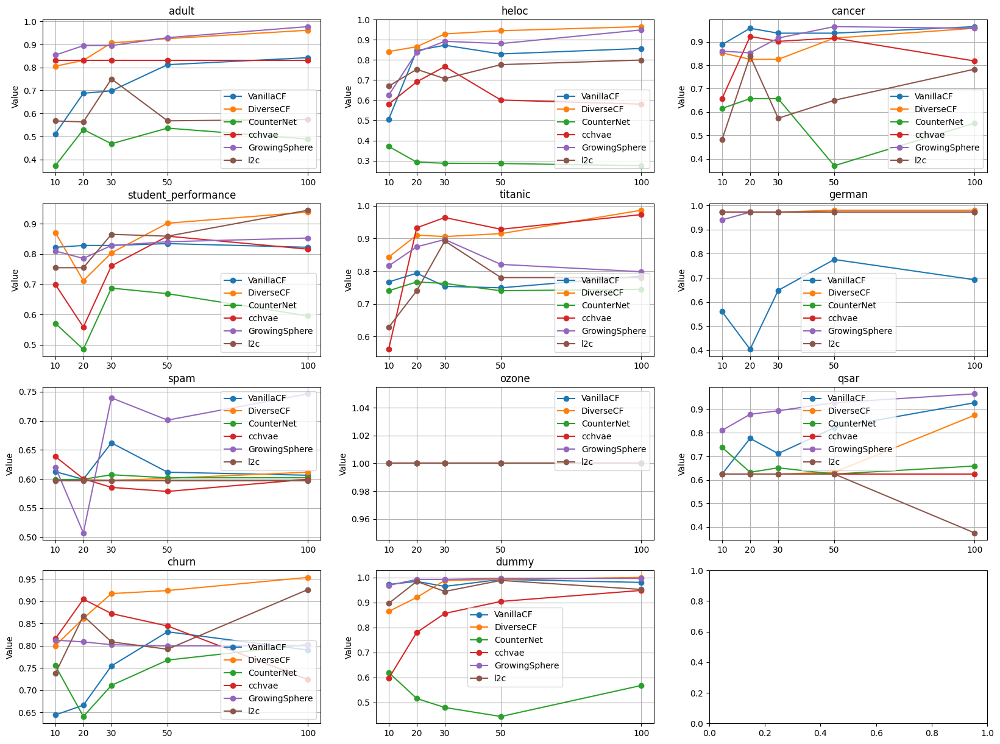

In [ ]:
fig, axes = plt.subplots(4, 3, figsize=(20, 15))

for i, (data_name, res) in enumerate(results):
    plot_agreements(res, axes[i // 3, i % 3], title=data_name)
fig.savefig('../figs/extract-results.pdf')

In [ ]:
results[-2]

('ozone',
                10   20   30   50   100
 CFModule                              
 VanillaCF      1.0  1.0  1.0  1.0  1.0
 DiverseCF      1.0  1.0  1.0  1.0  1.0
 CounterNet     1.0  1.0  1.0  1.0  1.0
 cchvae         1.0  1.0  1.0  1.0  1.0
 GrowingSphere  1.0  1.0  1.0  1.0  1.0)

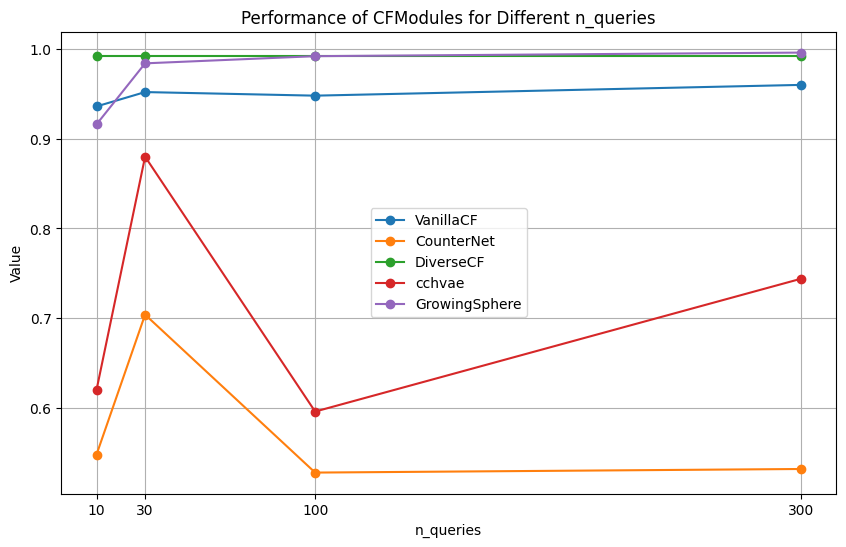

In [ ]:
plot_agreements(dummy_result)

## Analysis

In [ ]:
n_feats = 2
xs, ys = make_classification(
    n_samples=10000, 
    # n_samples=100, 
    n_features=n_feats, n_informative=n_feats, n_redundant=0, n_classes=2, random_state=0
)
queried_xs, test_xs, train_ys, test_ys = train_test_split(xs, ys, test_size=0.2)

In [ ]:
dm = DataModule.from_numpy(queried_xs, train_ys, name="dummy")

In [ ]:
test_xs_df = pd.DataFrame(test_xs, columns=[f'feature_{i}' for i in range(test_xs.shape[1])] )
test_ys_df = pd.DataFrame(test_ys, columns=['label'])
test_df = pd.concat([test_xs_df, test_ys_df], axis=1)

test_xs_transformed = dm.transform(test_df)

In [ ]:
# ml_module = _train_model(MLModule(), dm['train'], train_kwargs={'epochs': 100})
# ml_module.save("../../assets/models/01_extract/MLModule")

In [ ]:
ml_module = MLModule.load_from_path("../../assets/models/01_extract/MLModule")

In [ ]:
f"Accuracy: {(ml_module.pred_fn(test_xs_transformed).argmax(axis=1) == test_ys).mean()}"

'Accuracy: 0.8710000514984131'

### CounterNet

In [ ]:
# cfnet = CounterNet({"lr": 0.0003, "lambda_3": 50})
cfnet = CounterNet({"lr": 0.0003, "lambda_3": 4})
exp = relax.generate_cf_explanations(
    cfnet,
    dm,
    pred_fn=None,
    train_config={"epochs": 500},
)
relax.benchmark_cfs([exp])

/home/birk/miniconda3/envs/keras/lib/python3.9/site-packages/relax/legacy/ckpt_manager.py:47: UserWarning: `monitor_metrics` is not specified in `CheckpointManager`. No checkpoints will be stored.
  warnings.warn(
Epoch 499: 100%|██████████| 47/47 [00:00<00:00, 122.81batch/s, train/train_loss_1=0.047071982, train/train_loss_2=0.035417624, train/train_loss_3=0.0075218882] 


,,acc,validity,proximity
dummy,CounterNet,0.911875,0.998625,0.199948


In [ ]:
mlp = MLModule({'sizes': [50, 10, 10]})
agree, dual_attack_mlp, dual_cfs = dual_cfs_attack(
    exp, cfnet, mlp, test_xs_transformed, n_queries=1000, train_kwargs={'epochs': 50}, return_dual_cfs=True
)
print("DualCF agreements: ", agree)

/home/birk/miniconda3/envs/keras/lib/python3.9/site-packages/jax/_src/random.py:560: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)


DualCF agreements:  0.39900002


In [ ]:
mlp = MLModule({'sizes': [50, 10, 10]})
agree, model = query_model(exp, cfnet, mlp, test_xs_transformed, n_queries=2000, train_kwargs={'epochs': 50})
print("Baseline agreements: ", agree)

Baseline agreements:  0.86800003


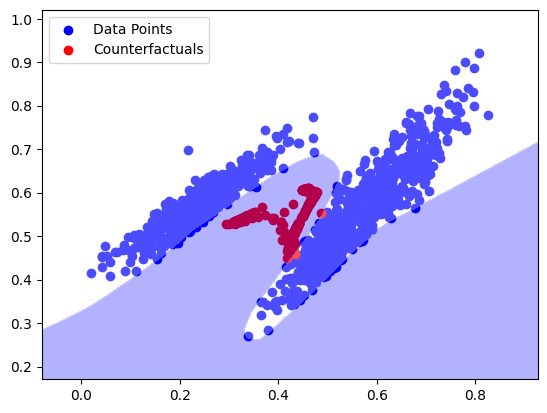

In [ ]:
test_indices = jnp.array(exp.test_indices)
indices = jnp.where(cfnet.pred_fn(exp.xs[test_indices]).argmax(axis=1) == 1)[0]
indices = test_indices[indices]
cfs = exp.cfs.reshape(-1, n_feats)
visualize_model_xs_cfs(exp.xs[indices], cfs[indices], cfnet.pred_fn)

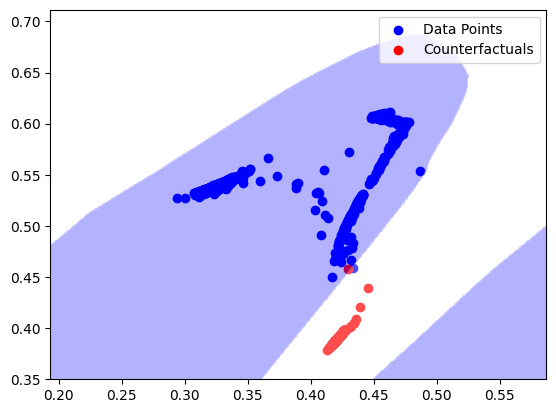

In [ ]:
visualize_model_xs_cfs(cfs[indices], dual_cfs[indices], exp.pred_fn)

### DiCE

In [ ]:
# cfnet = CounterNet({"lr": 0.0003, "lambda_3": 50})
dice = DiverseCF({'lambda_2': 4})
exp = relax.generate_cf_explanations(
    dice,
    dm,
    pred_fn=ml_module.pred_fn,
    # train_config={"epochs": 500},
)
relax.benchmark_cfs([exp])

  0%|          | 0/1000 [00:00<?, ?it/s]

,,acc,validity,proximity
dummy,DiverseCF,0.87525,0.99585,0.307919


In [ ]:
rfc = RandomForestClassifier()
models = [
    ('MLP', MLPClassifier()),
    ('RF', RandomForestClassifier()),
    ('SVC', SVC(probability=True)),
]

agreements = []
for name, model in models:
    agree, dual_attack_mlp, dual_cfs = dual_cfs_attack(
        exp, dice, model, test_xs_transformed, 
        n_queries=1000, train_kwargs={'epochs': 50}, 
        return_dual_cfs=True
    )
    agreements.append((name, agree))
    print(f"{name} agreements: ", agree)

# agree, dual_attack_mlp, dual_cfs = dual_cfs_attack(
#     exp, dice, rfc, test_xs_transformed, n_queries=1000, train_kwargs={'epochs': 50}, return_dual_cfs=True
# )
# print("DualCF agreements: ", agree)

  0%|          | 0/1000 [00:00<?, ?it/s]

cfs.shape (40000, 2)
dual_cfs.shape (40000, 5, 2)


/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)


dual_cf benchmark: 
          validity   proximity
CFModule  0.99838  0.24791148


/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLP agreements:  0.86800003


  0%|          | 0/1000 [00:00<?, ?it/s]

cfs.shape (40000, 2)
dual_cfs.shape (40000, 5, 2)
dual_cf benchmark: 
          validity   proximity
CFModule  0.99838  0.24791148


/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/base.py:1152: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


RF agreements:  0.84900004


  0%|          | 0/1000 [00:00<?, ?it/s]

cfs.shape (40000, 2)
dual_cfs.shape (40000, 5, 2)
dual_cf benchmark: 
          validity   proximity
CFModule  0.99838  0.24791145


/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/jax/_src/random.py:563: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
/home/birk/mambaforge-pypy3/envs/gpu/lib/python3.10/site-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


SVC agreements:  0.76400006


In [ ]:
mlp = MLModule({'sizes': [500, 100, 100]})
agree, dual_attack_mlp, dual_cfs = dual_cfs_attack(
    exp, dice, mlp, test_xs_transformed, n_queries=1000, train_kwargs={'epochs': 50}, return_dual_cfs=True
)
print("DualCF agreements: ", agree)

  0%|          | 0/1000 [00:00<?, ?it/s]

cfs.shape (40000, 2)
dual_cfs.shape (40000, 5, 2)
Validity: 0.9993999600410461
DualCF agreements:  0.72450006


In [ ]:
mlp = MLModule({'sizes': [50, 10, 10]})
agree, model = query_model(
    exp, dice, mlp, test_xs_transformed, 
    n_queries=1000, train_kwargs={'epochs': 50})
print("Baseline agreements: ", agree)

Baseline agreements:  0.84450006


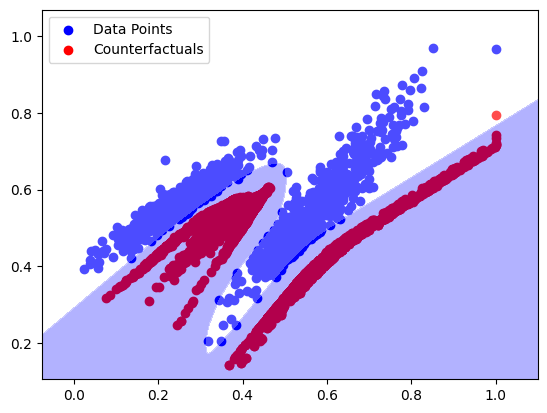

In [ ]:
test_indices = jnp.array(exp.test_indices)
indices = jnp.where(exp.pred_fn(exp.xs[test_indices]).argmax(axis=1) == 1)[0]
indices = test_indices[indices]
cfs = exp.cfs[indices].reshape(-1, n_feats)
visualize_model_xs_cfs(exp.xs[indices], cfs, exp.pred_fn)

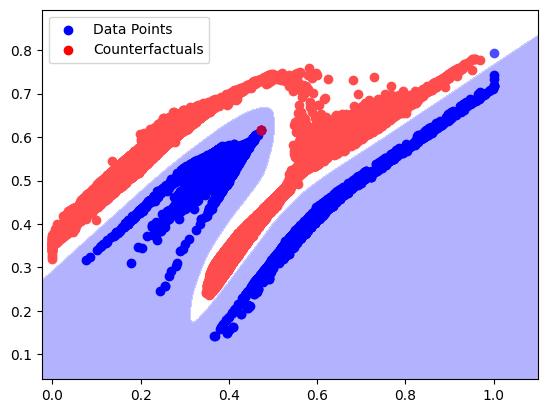

In [ ]:
visualize_model_xs_cfs(cfs, dual_cfs.reshape(-1, 5, 5, n_feats)[indices, :].reshape(-1, n_feats), exp.pred_fn)

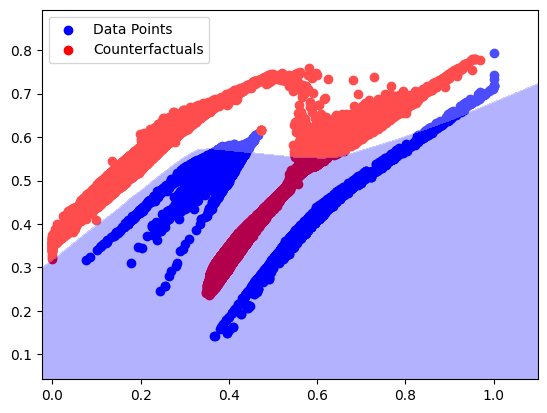

In [ ]:
visualize_model_xs_cfs(cfs, dual_cfs.reshape(-1, 5, 5, n_feats)[indices, :].reshape(-1, n_feats), mlp.pred_fn)